# Quality Assessment and Preprocessing 
    1. Manual bad channel detection (results in cell2, screenshots in ```GitRepo/preproc/bad_channels_psd/*)```;
    2. Read raw eeg data, mark bad channels, update montage and remove EOG channelsl
    3. Rereference to average of M1 and M2, removal reference channels;
    4. High pass with f>1 Hz and notch filter @ 50Hz;
    5. Automatic + manual EOG artifact (results in cell2 ) removal (ICA topomaps in GitRepo/preproc/ICA_topomaps/*);
    6. Save the preprocessed data in derivative/preproc folders.
    7. Addditionally provide quality assessment scores in cell 2.
# Observations:
    1. Sub 1-16 generally have good quality (shilded booth), denote this group G1;
    2. sub 17-33 generally have worse quality (no shilded booth), denote this group G2;
    3. Lots of powerline artifacts and its harmonics have been seen;
    4. Lost of wide band artifacts detected in P2, P4 and PO4 for most G2 subjects in Gamma band (2 peaks around 70 and 80Hz), some examples in ```GitRepo/preproc/bad_channels_psd/*```.

In [1]:
import os
from pathlib import Path
import mne
from mne_bids import BIDSPath, read_raw_bids, write_raw_bids, print_dir_tree, make_report, print_dir_tree, inspect_dataset
from mne.preprocessing import ICA, create_eog_epochs, create_ecg_epochs, corrmap
import numpy as np
import pandas as pd
#%matplotlib inline

# system folders
bids_dir = Path("/data/raw")
codes_dir = Path("/codes")
preproc_dir = Path("/output/preproc")

# subject list
sub_list = [f"{a:03}" for a in range(1,34,1)]

# sub eeg and events files
sub_eeg_list = [(bids_dir / ("sub-"+x) / "eeg" / ("sub-"+x+"_task-xxxx_eeg.vhdr")) for x in sub_list]
sub_eeg_dict = dict(zip(sub_list, sub_eeg_list))

# overall triger data
trigger_data_dir = codes_dir / "tab_data" / "TriggerTable.csv"
trigger_df = pd.read_csv(trigger_data_dir, sep=',');

In [2]:
# Mannual visual QC
# Data from subjects 1–17 were recorded in an electrically shielded booth, while no shielding was available for subjects 18–33. Thus, stronger power line contamination at 50 Hz is expected.
bad_channels=dict(zip(sub_list , [ [] for x in range(len(sub_list))]))
bad_channels['001']=['T8']
bad_channels['011']=['P2']
## decided to include these channels even thought the quality is not ideal.
# bad_channels['016']=['FC4', 'PO4', 'P2', 'P4']
# bad_channels['018']=[ 'PO4', 'P2', 'P4']
# bad_channels['019']=[ 'PO4', 'P2']
QA_sub=dict(zip(sub_list , [ 0 for x in range(len(sub_list))]))
QA_sub['001']=2; QA_sub['002']=3; QA_sub['003']=3; QA_sub['004']=3; QA_sub['005']=2; QA_sub['006']=3; QA_sub['007']=2; QA_sub['008']=3
QA_sub['009']=3; QA_sub['010']=2; QA_sub['011']=2; QA_sub['012']=2; QA_sub['013']=3; QA_sub['014']=2; QA_sub['015']=3; QA_sub['016']=2
QA_sub['017']=2; QA_sub['018']=2; QA_sub['019']=2; QA_sub['020']=2; QA_sub['021']=2; QA_sub['022']=2; QA_sub['023']=3; QA_sub['024']=3
QA_sub['025']=3; QA_sub['026']=3; QA_sub['027']=3; QA_sub['028']=2; QA_sub['029']=3; QA_sub['030']=2; QA_sub['031']=3; QA_sub['032']=3; QA_sub['033']=3
# visual detection of EOG componets
manuEOG_ICs=dict(zip(sub_list , [ [] for x in range(len(sub_list))]))
manuEOG_ICs['001'] = [3]; manuEOG_ICs['004'] = [7]; manuEOG_ICs['008'] = [1]; manuEOG_ICs['018'] = [5]; manuEOG_ICs['019'] = [5]; manuEOG_ICs['020'] = [8]
manuEOG_ICs['021'] = [9]; manuEOG_ICs['022'] = [2]; manuEOG_ICs['025'] = [1]; manuEOG_ICs['029'] = [9]; manuEOG_ICs['032'] = [1]; manuEOG_ICs['033'] = [6]

Preprocessing of sub-001, reading raw eeg...
Extracting parameters from /data/raw/sub-001/eeg/sub-001_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2541055  =      0.000 ...  4962.998 secs...
bad channels marked for sub-001, and they are:  ['T8']
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 001 has 66 channels.
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1691 samples (3.303 sec)

Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-cau

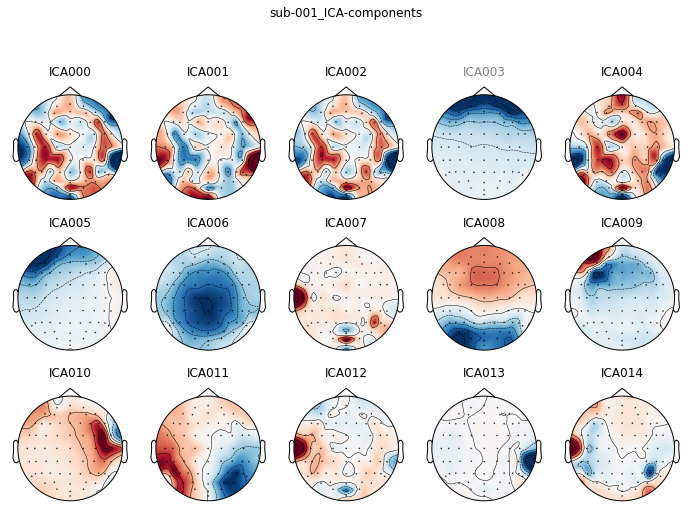

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 63 PCA components
<Info | 10 non-empty values
 bads: 1 items (T8)
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-001/sub-001_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-001/sub-001_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-002, reading raw eeg...
Extracting parameters from /data/raw/sub-002/eeg/sub-002_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1840127  =      0.000 ...  3593.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 002 has 66 channels.
Filtering raw data in 1

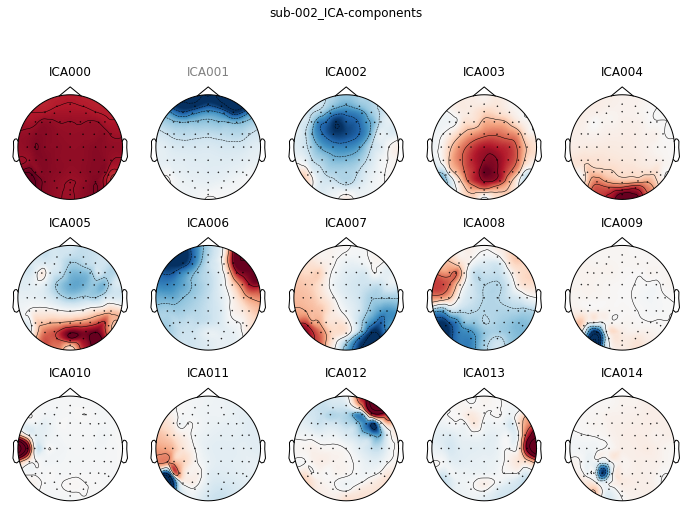

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-002/sub-002_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-002/sub-002_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-003, reading raw eeg...
Extracting parameters from /data/raw/sub-003/eeg/sub-003_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1991679  =      0.000 ...  3889.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 003 has 66 channels.
Filtering raw data in 1 contiguous

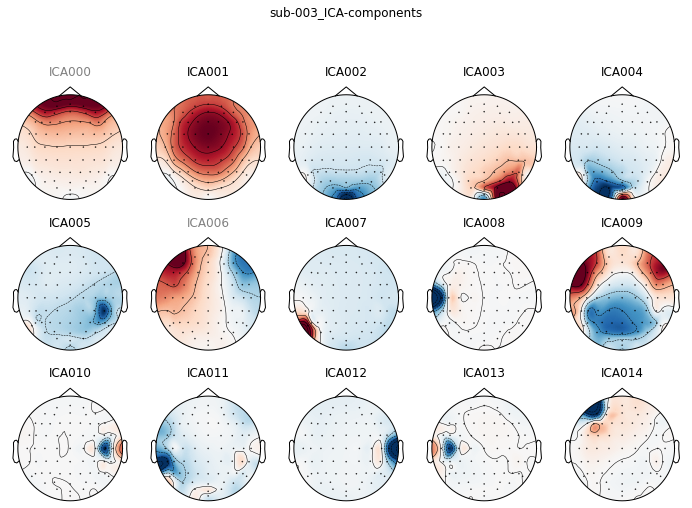

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-003/sub-003_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-003/sub-003_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-004, reading raw eeg...
Extracting parameters from /data/raw/sub-004/eeg/sub-004_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1854463  =      0.000 ...  3621.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 004 has 66 channels.
Filtering raw data in 1 contiguou

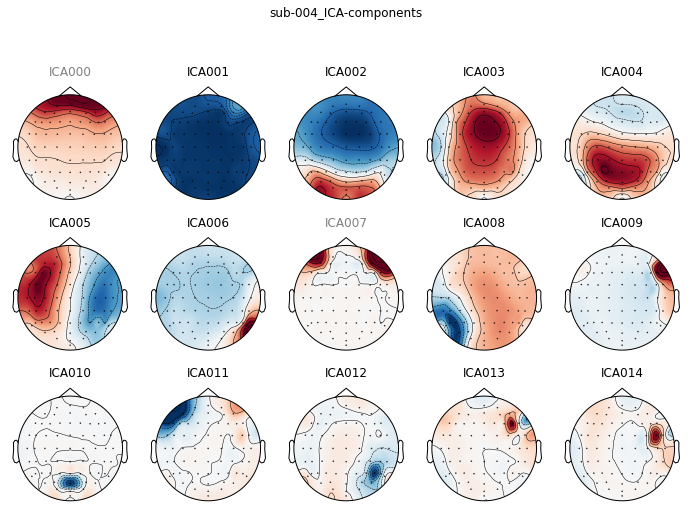

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-004/sub-004_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-004/sub-004_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-005, reading raw eeg...
Extracting parameters from /data/raw/sub-005/eeg/sub-005_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1893375  =      0.000 ...  3697.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 005 has 66 channels.
Filtering raw data in 1 contiguou

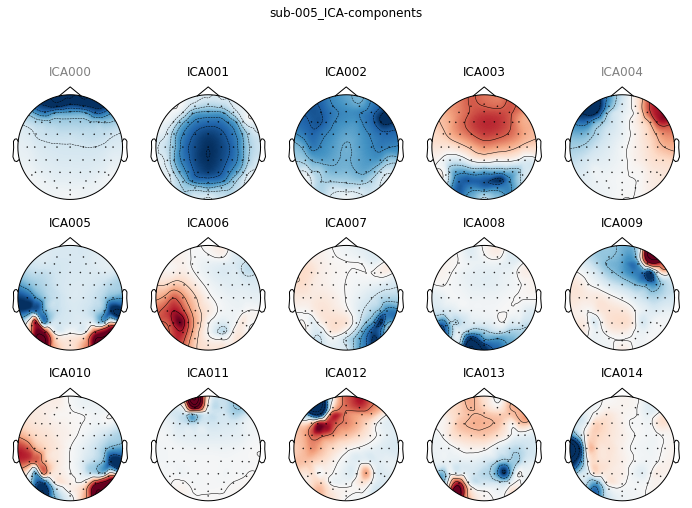

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-005/sub-005_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-005/sub-005_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-006, reading raw eeg...
Extracting parameters from /data/raw/sub-006/eeg/sub-006_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2139647  =      0.000 ...  4178.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 006 has 66 channels.
Filtering raw data in 1 contiguou

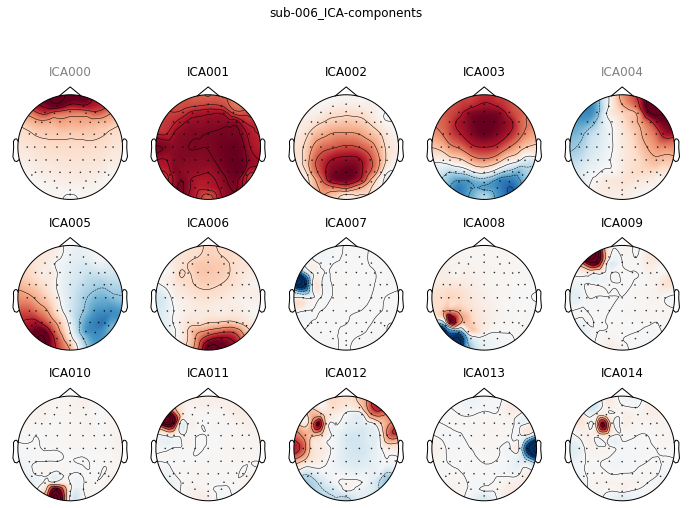

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-006/sub-006_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-006/sub-006_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-007, reading raw eeg...
Extracting parameters from /data/raw/sub-007/eeg/sub-007_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2161663  =      0.000 ...  4221.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 007 has 66 channels.
Filtering raw data in 1 contiguou

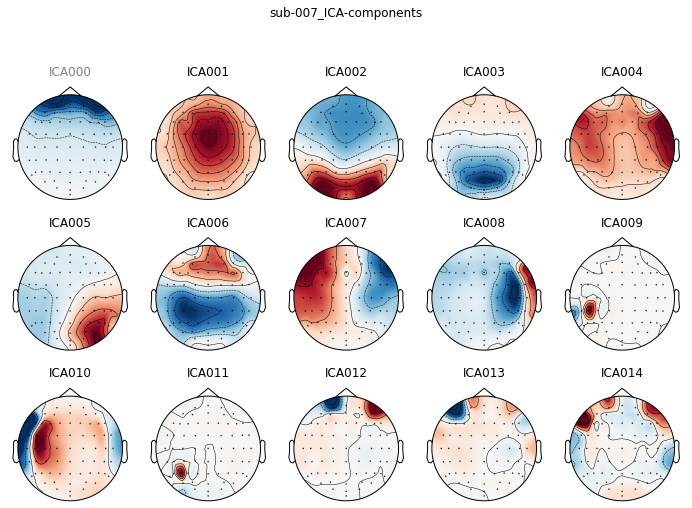

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-007/sub-007_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-007/sub-007_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-008, reading raw eeg...
Extracting parameters from /data/raw/sub-008/eeg/sub-008_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1901055  =      0.000 ...  3712.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 008 has 66 channels.
Filtering raw data in 1 contiguous

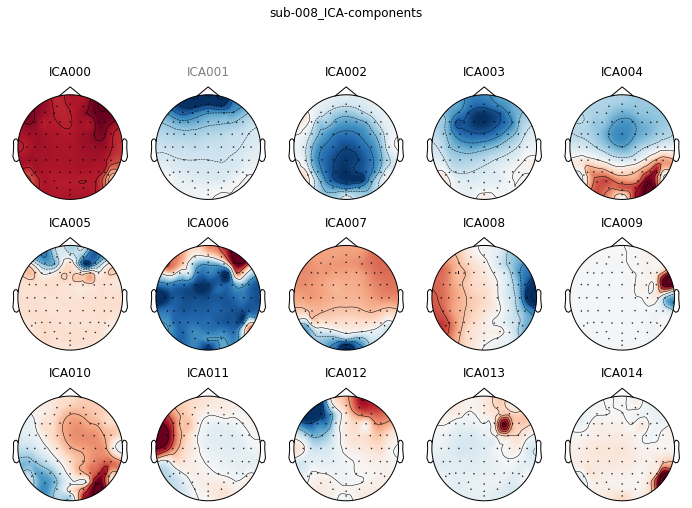

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-008/sub-008_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-008/sub-008_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-009, reading raw eeg...
Extracting parameters from /data/raw/sub-009/eeg/sub-009_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2161663  =      0.000 ...  4221.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 009 has 66 channels.
Filtering raw data in 1 contiguous

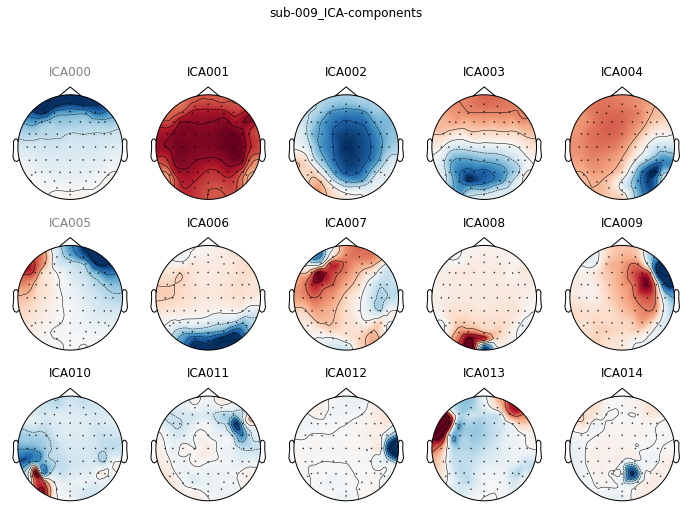

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-009/sub-009_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-009/sub-009_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-010, reading raw eeg...
Extracting parameters from /data/raw/sub-010/eeg/sub-010_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1898495  =      0.000 ...  3707.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 010 has 66 channels.
Filtering raw data in 1 contiguou

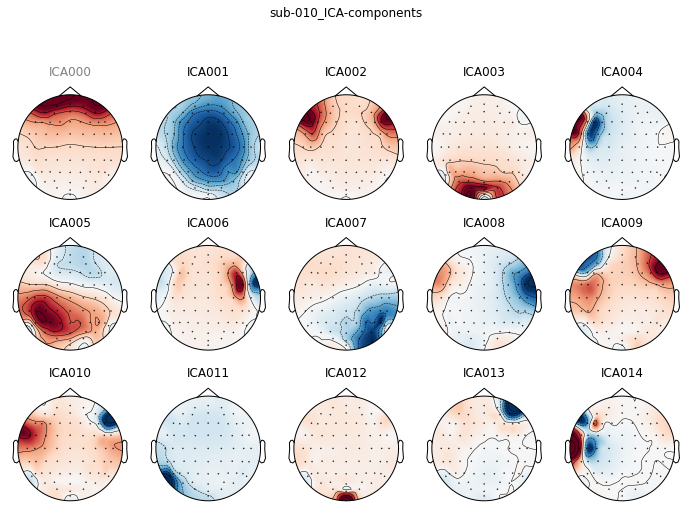

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-010/sub-010_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-010/sub-010_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-011, reading raw eeg...
Extracting parameters from /data/raw/sub-011/eeg/sub-011_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1953279  =      0.000 ...  3814.998 secs...
bad channels marked for sub-011, and they are:  ['P2']
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 

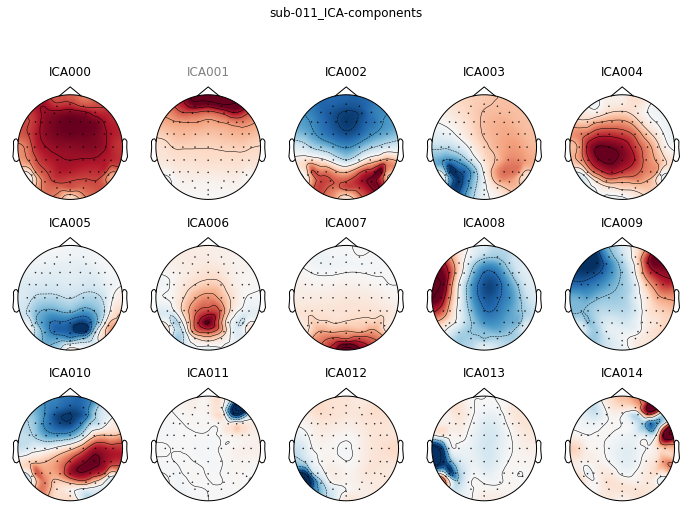

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 63 PCA components
<Info | 10 non-empty values
 bads: 1 items (P2)
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-011/sub-011_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-011/sub-011_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-012, reading raw eeg...
Extracting parameters from /data/raw/sub-012/eeg/sub-012_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2206719  =      0.000 ...  4309.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 012 has 66 channels.
Filtering raw data in 1

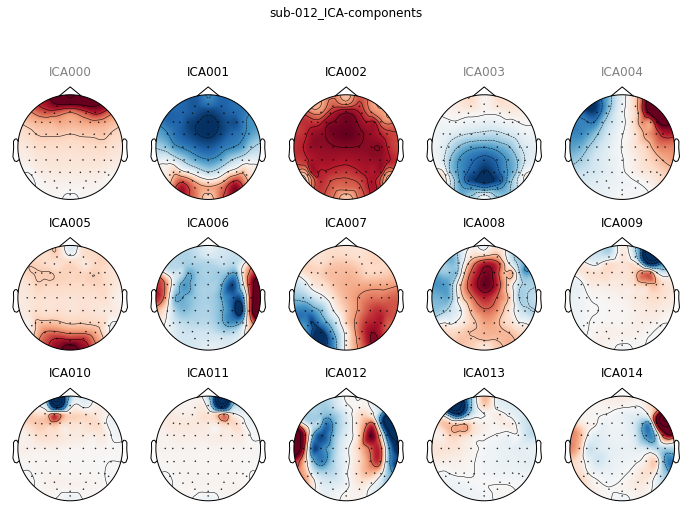

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 3 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-012/sub-012_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-012/sub-012_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-013, reading raw eeg...
Extracting parameters from /data/raw/sub-013/eeg/sub-013_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1993215  =      0.000 ...  3892.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 013 has 66 channels.
Filtering raw data in 1 contiguou

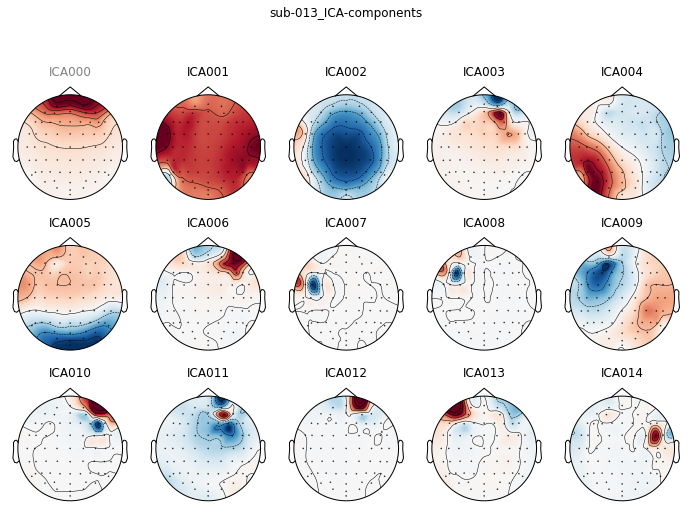

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-013/sub-013_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-013/sub-013_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-014, reading raw eeg...
Extracting parameters from /data/raw/sub-014/eeg/sub-014_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1761791  =      0.000 ...  3440.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 014 has 66 channels.
Filtering raw data in 1 contiguous

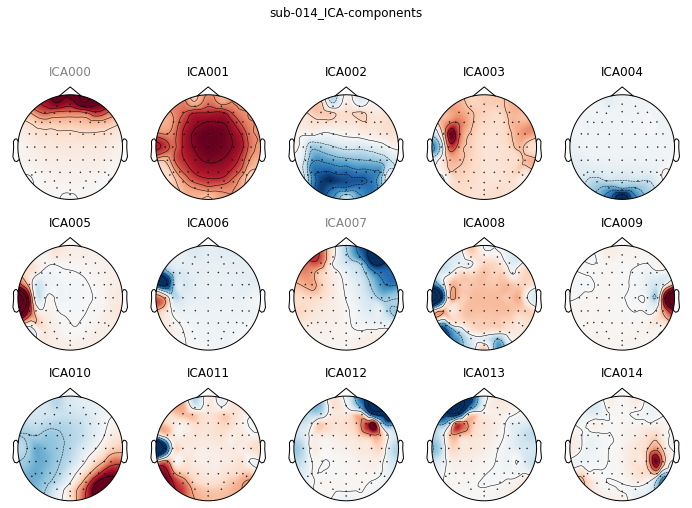

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-014/sub-014_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-014/sub-014_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-015, reading raw eeg...
Extracting parameters from /data/raw/sub-015/eeg/sub-015_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1955327  =      0.000 ...  3818.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 015 has 66 channels.
Filtering raw data in 1 contiguou

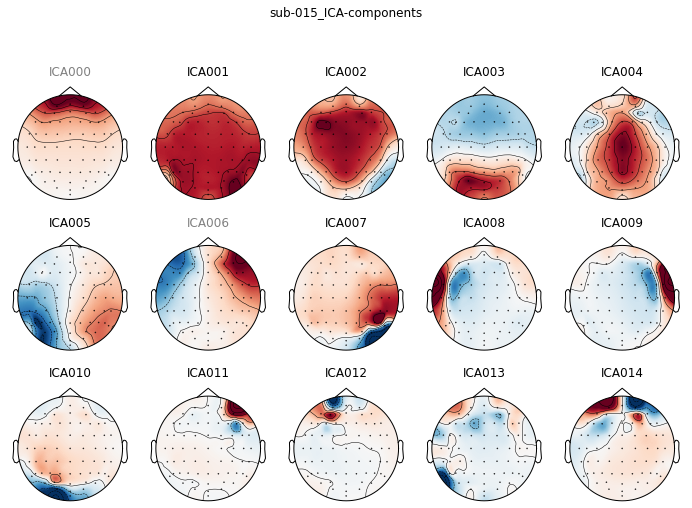

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-015/sub-015_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-015/sub-015_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-016, reading raw eeg...
Extracting parameters from /data/raw/sub-016/eeg/sub-016_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1789439  =      0.000 ...  3494.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 016 has 66 channels.
Filtering raw data in 1 contiguou

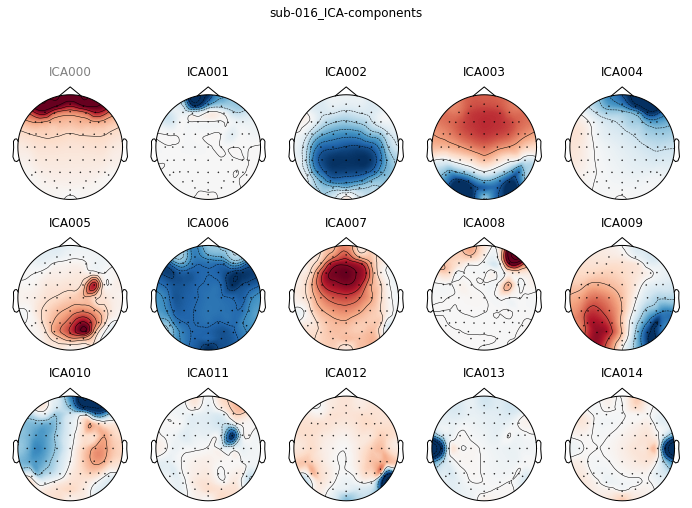

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-016/sub-016_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-016/sub-016_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-017, reading raw eeg...
Extracting parameters from /data/raw/sub-017/eeg/sub-017_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1925631  =      0.000 ...  3760.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 017 has 66 channels.
Filtering raw data in 1 contiguous

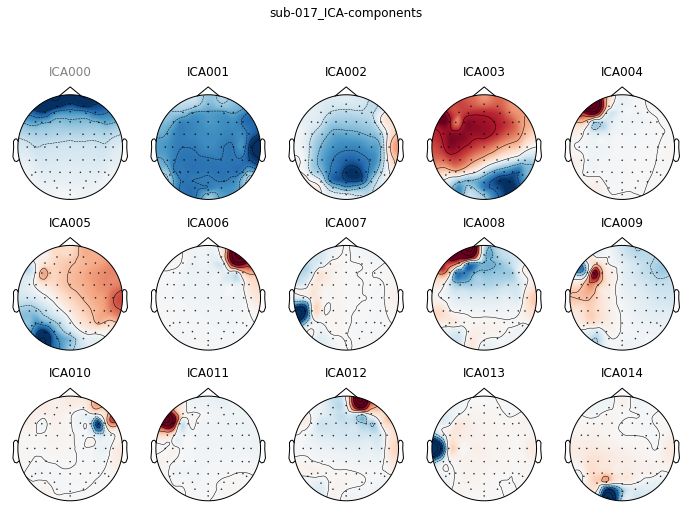

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-017/sub-017_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-017/sub-017_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-018, reading raw eeg...
Extracting parameters from /data/raw/sub-018/eeg/sub-018_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2240511  =      0.000 ...  4375.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 018 has 66 channels.
Filtering raw data in 1 contiguous

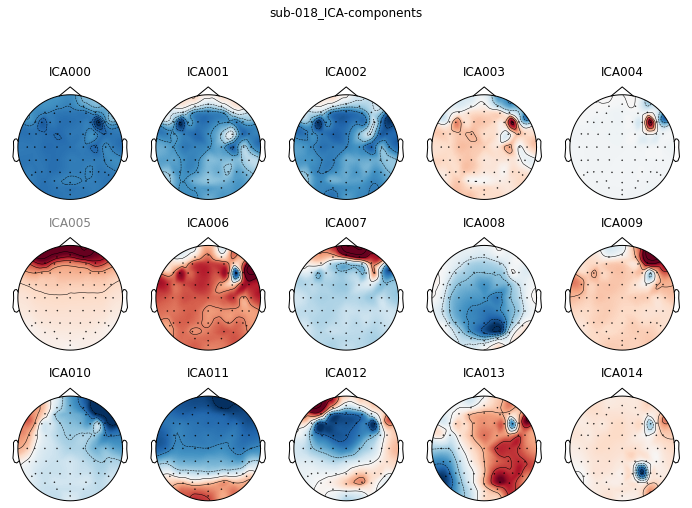

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-018/sub-018_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-018/sub-018_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-019, reading raw eeg...
Extracting parameters from /data/raw/sub-019/eeg/sub-019_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2308095  =      0.000 ...  4507.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 019 has 66 channels.
Filtering raw data in 1 contiguous

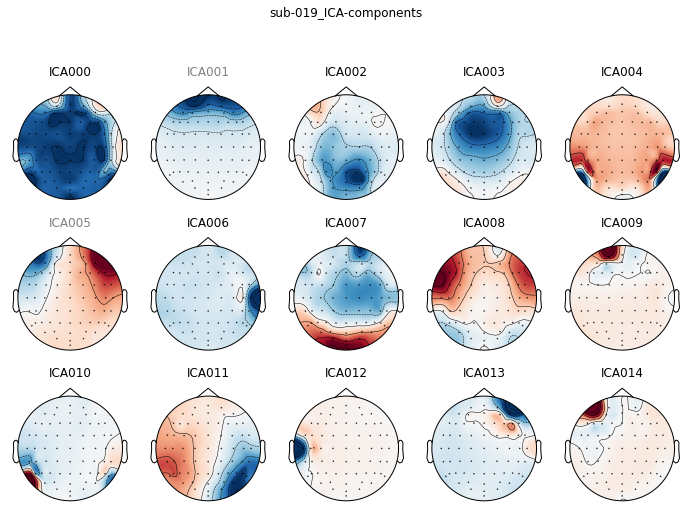

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-019/sub-019_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-019/sub-019_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-020, reading raw eeg...
Extracting parameters from /data/raw/sub-020/eeg/sub-020_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2928639  =      0.000 ...  5719.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 020 has 66 channels.
Filtering raw data in 1 contiguou

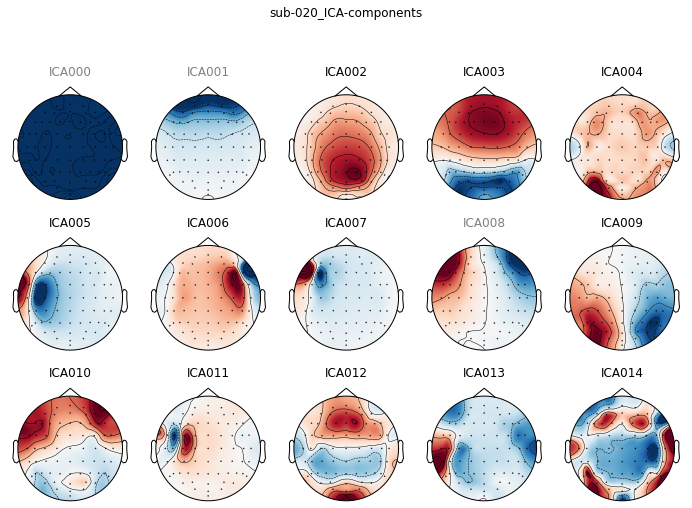

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 3 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-020/sub-020_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-020/sub-020_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-021, reading raw eeg...
Extracting parameters from /data/raw/sub-021/eeg/sub-021_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2010111  =      0.000 ...  3925.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 021 has 66 channels.
Filtering raw data in 1 contiguou

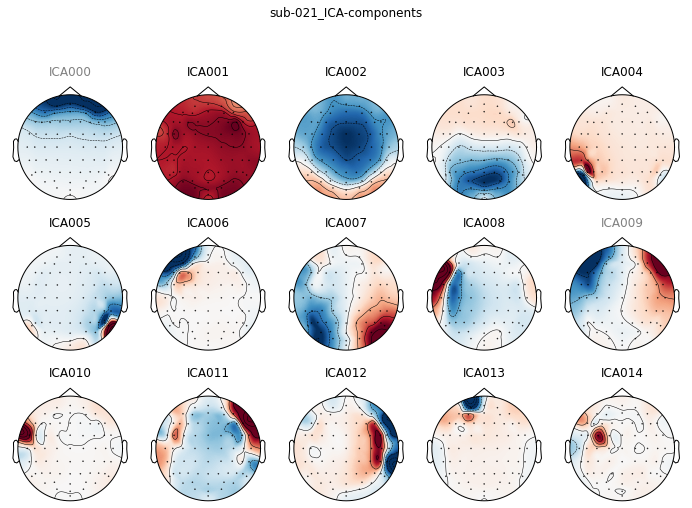

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-021/sub-021_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-021/sub-021_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-022, reading raw eeg...
Extracting parameters from /data/raw/sub-022/eeg/sub-022_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2231295  =      0.000 ...  4357.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 022 has 66 channels.
Filtering raw data in 1 contiguou

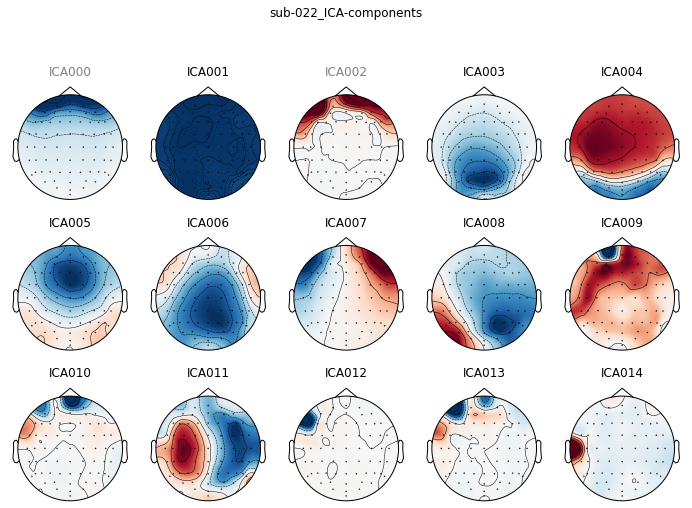

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-022/sub-022_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-022/sub-022_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-023, reading raw eeg...
Extracting parameters from /data/raw/sub-023/eeg/sub-023_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2220543  =      0.000 ...  4336.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 023 has 66 channels.
Filtering raw data in 1 contiguou

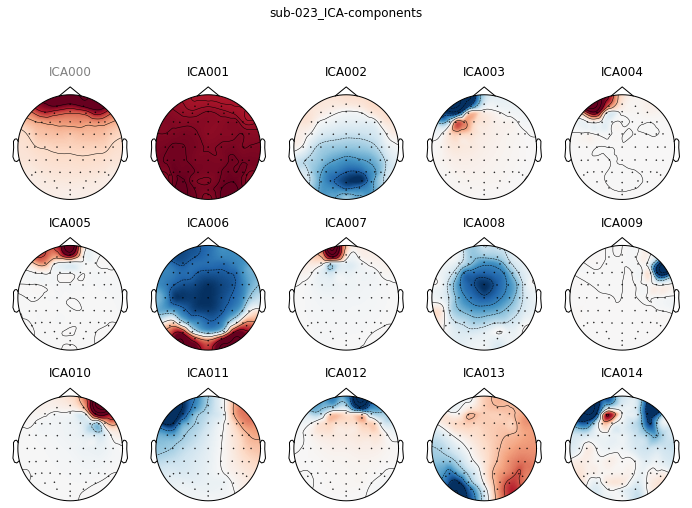

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-023/sub-023_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-023/sub-023_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-024, reading raw eeg...
Extracting parameters from /data/raw/sub-024/eeg/sub-024_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2211839  =      0.000 ...  4319.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 024 has 66 channels.
Filtering raw data in 1 contiguous

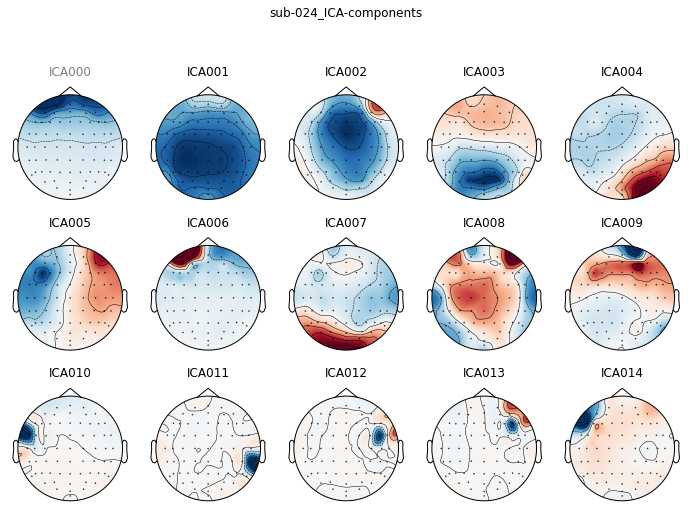

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-024/sub-024_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-024/sub-024_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-025, reading raw eeg...
Extracting parameters from /data/raw/sub-025/eeg/sub-025_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2197503  =      0.000 ...  4291.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 025 has 66 channels.
Filtering raw data in 1 contiguous

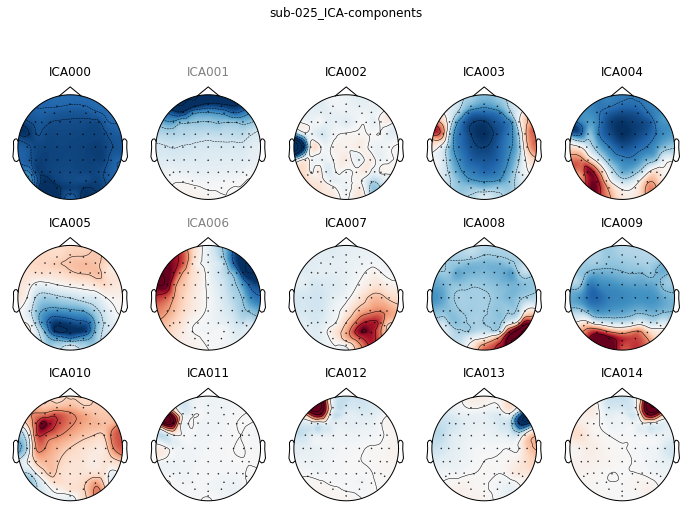

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-025/sub-025_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-025/sub-025_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-026, reading raw eeg...
Extracting parameters from /data/raw/sub-026/eeg/sub-026_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1995775  =      0.000 ...  3897.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 026 has 66 channels.
Filtering raw data in 1 contiguou

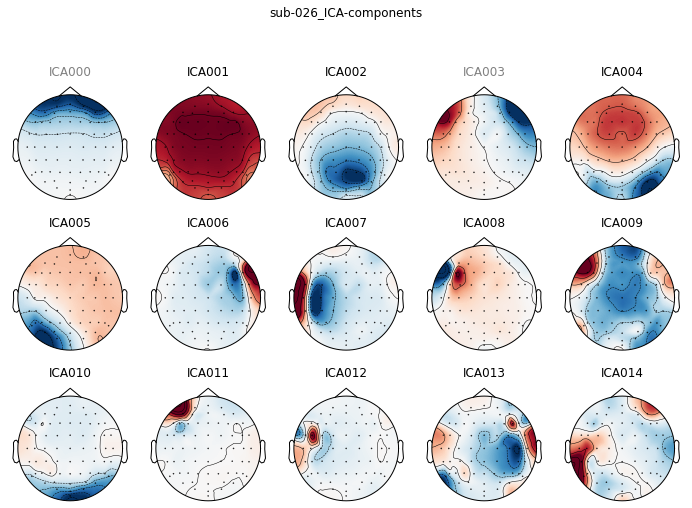

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-026/sub-026_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-026/sub-026_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-027, reading raw eeg...
Extracting parameters from /data/raw/sub-027/eeg/sub-027_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 1931775  =      0.000 ...  3772.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 027 has 66 channels.
Filtering raw data in 1 contiguou

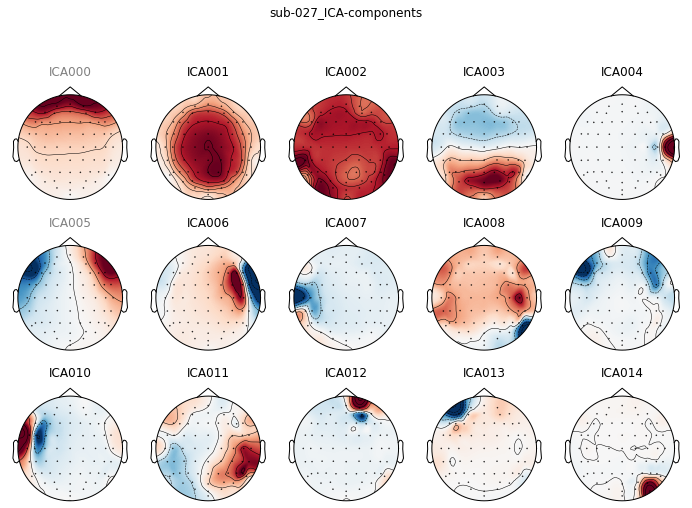

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-027/sub-027_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-027/sub-027_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-028, reading raw eeg...
Extracting parameters from /data/raw/sub-028/eeg/sub-028_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2146303  =      0.000 ...  4191.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 028 has 66 channels.
Filtering raw data in 1 contiguou

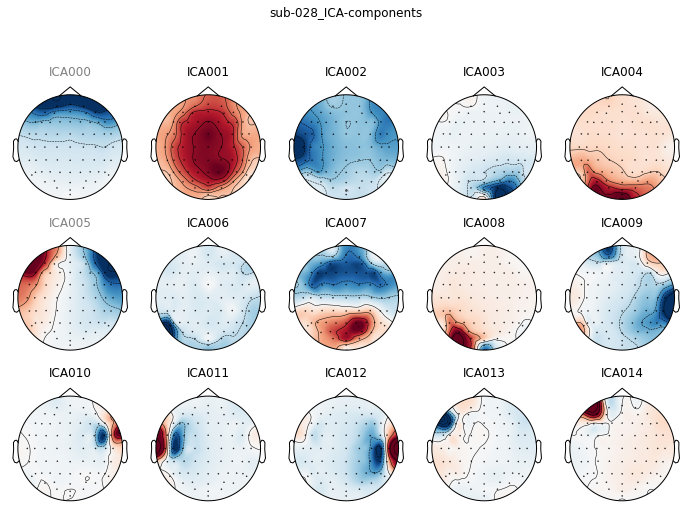

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-028/sub-028_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-028/sub-028_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-029, reading raw eeg...
Extracting parameters from /data/raw/sub-029/eeg/sub-029_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2231295  =      0.000 ...  4357.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 029 has 66 channels.
Filtering raw data in 1 contiguou

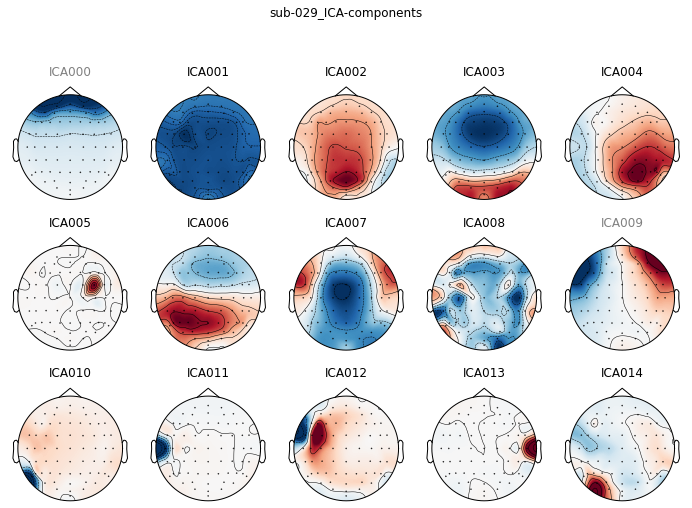

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-029/sub-029_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-029/sub-029_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-030, reading raw eeg...
Extracting parameters from /data/raw/sub-030/eeg/sub-030_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2257919  =      0.000 ...  4409.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 030 has 66 channels.
Filtering raw data in 1 contiguou

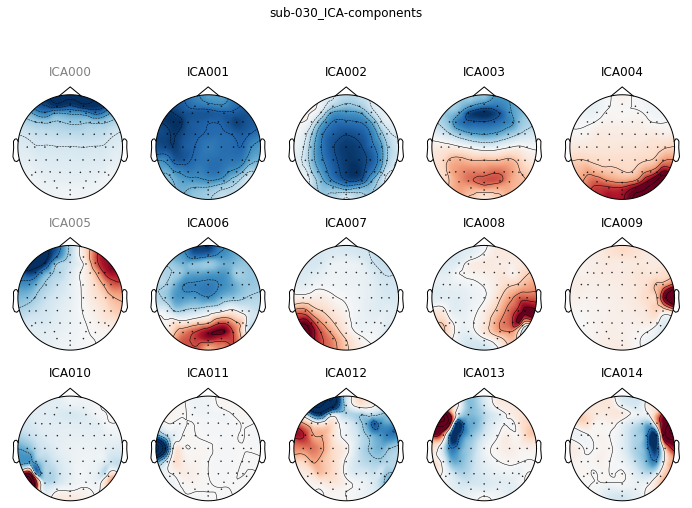

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-030/sub-030_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-030/sub-030_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-031, reading raw eeg...
Extracting parameters from /data/raw/sub-031/eeg/sub-031_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2163711  =      0.000 ...  4225.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 031 has 66 channels.
Filtering raw data in 1 contiguou

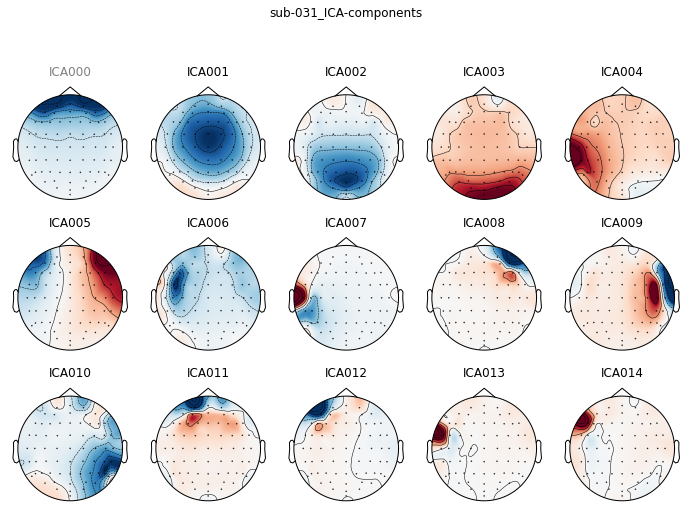

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-031/sub-031_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-031/sub-031_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-032, reading raw eeg...
Extracting parameters from /data/raw/sub-032/eeg/sub-032_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2456063  =      0.000 ...  4796.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 032 has 66 channels.
Filtering raw data in 1 contiguous

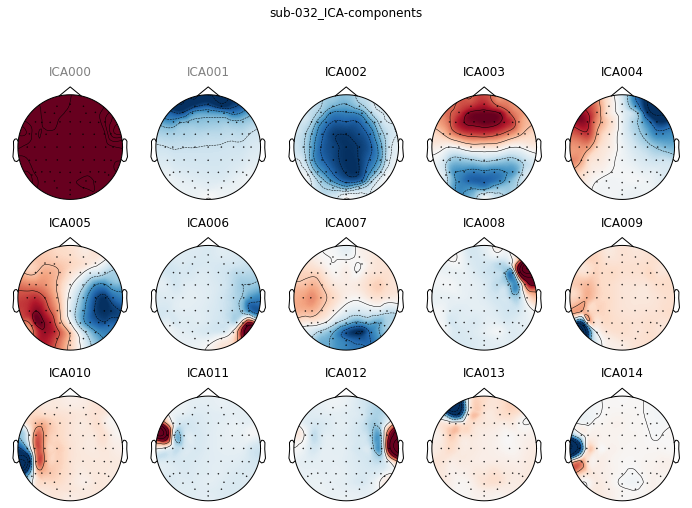

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-032/sub-032_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-032/sub-032_task-xxxx_desc-preproc_eeg.fif
[done]
Preprocessing of sub-033, reading raw eeg...
Extracting parameters from /data/raw/sub-033/eeg/sub-033_task-xxxx_eeg.vhdr...
Setting channel info structure...
Reading 0 ... 2299391  =      0.000 ...  4490.998 secs...
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.
after removing reference channels (M1, M2), 033 has 66 channels.
Filtering raw data in 1 contiguou

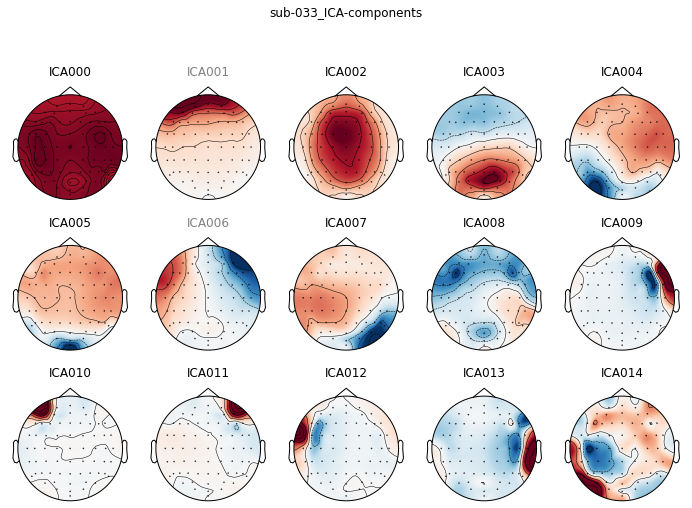

saving...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components
<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Writing /output/preproc/sub-033/sub-033_task-xxxx_desc-preproc_eeg.fif
Closing /output/preproc/sub-033/sub-033_task-xxxx_desc-preproc_eeg.fif
[done]


In [3]:
# Preprocessing block
save_fig = 1

RAND_STAT=100
N_ICA = 15
biosemi_montage = mne.channels.make_standard_montage('biosemi64')
Ref_chans = ['M1', 'M2']
EOG_generated = ["VEOG", "HEOG"]
EOG_chans = ["Afp9", "Afp10", "IO1", "IO2"]
chan_types_dict = dict(zip(EOG_generated,["eog"]*len(EOG_generated)))

# Frequency bands
Preproc_band = [1, 150];
Delta_band = [1, 4];
Theta_band = [4, 8];
Alpha_band = [8, 12];
Beta_band  = [12, 30];
Gama_band  = [30, 100];

# ICA components
autoEOG_ICs=dict(zip(sub_list , [ [] for x in range(len(sub_list))]))
ica_fig_dir=codes_dir /"preproc"/ "ICA_topomaps"

# loop over for preprocessing
for sub_id in sub_list:
    ## read eeg data
    print("Preprocessing of sub-"+sub_id+", reading raw eeg...")
    raw = mne.io.read_raw_brainvision(sub_eeg_dict[sub_id], preload=True)
    raw = raw.set_montage(biosemi_montage, on_missing='ignore')
    ## drop bad channels
    if bad_channels[sub_id] != []:
        raw.info['bads'].extend(bad_channels[sub_id])
        print('bad channels marked for sub-'+sub_id+', and they are: ', raw.info['bads'])
    ## rereference to mean(M1, M2)
    raw_reref=raw.set_eeg_reference(ref_channels=Ref_chans)            # rereference to mean(M1, M2)
    raw_reref=raw_reref.pick(picks=None, exclude=Ref_chans+EOG_chans)  # remove ref channels
    raw_reref.set_channel_types(chan_types_dict)                              # update channel types
    print('after removing reference channels (M1, M2), '+sub_id+f' has {raw_reref.info["nchan"]} channels.')
    ## high pass > 1 Hz, and notch 50 Hz
    raw_reref_bp = raw_reref.filter(l_freq=Preproc_band[0], h_freq=None, method='fir')
    raw_reref_filt = raw_reref_bp.notch_filter(freqs=(50))
    print("sub-"+sub_id+", high-pass and notch filtering finished...")
    ## ICA denoising EOG signals
    ica = ICA(n_components=N_ICA, max_iter='auto', random_state=RAND_STAT)
    ica.fit(raw_reref_filt)
    ica.exclude = []
    # find which ICs related to the EOG pattern
    eog_indices, eog_scores = ica.find_bads_eog(raw_reref_filt)
    autoEOG_ICs[sub_id] = eog_indices
    tmp_eog_ica = eog_indices + manuEOG_ICs[sub_id]
    print(sub_id, " IC maps:")
    ica.exclude = tmp_eog_ica
    print("EOG ICs to remove:", tmp_eog_ica)
    title_str = 'sub-'+sub_id+"_ICA-components"
    fig1=ica.plot_components(title=title_str)
    if save_fig: 
        print('saving...'); fig1[0].savefig((ica_fig_dir/(title_str+".png")), dpi=150, bbox_inches='tight', pad_inches=0.1)
    raw_reref_filt_ecgRemoved = raw_reref_filt
    ica.apply(raw_reref_filt_ecgRemoved) # apply ICA to remove EOG ICA components 
    raw_reref_filt_ecgRemoved=raw_reref_filt_ecgRemoved.pick(picks=None, exclude=EOG_generated)     # remove EoG channels
    print(raw_reref_filt_ecgRemoved.info)
    # save preprocessed data.
    preproc_sub_dir = preproc_dir / ("sub-"+sub_id)
    if (not preproc_sub_dir.is_dir()):
        os.mkdir(preproc_sub_dir)
    raw_reref_filt_ecgRemoved.save((preproc_sub_dir/("sub-"+sub_id+"_task-xxxx_desc-preproc_eeg.fif")), overwrite=True)

Opening raw-browser...


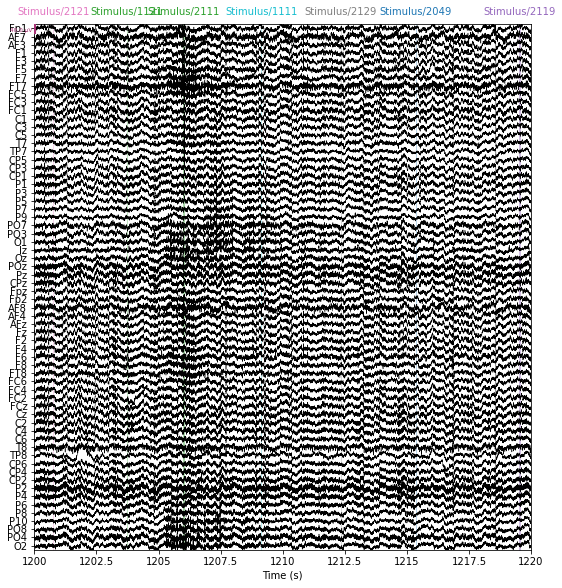

Opening raw-browser...


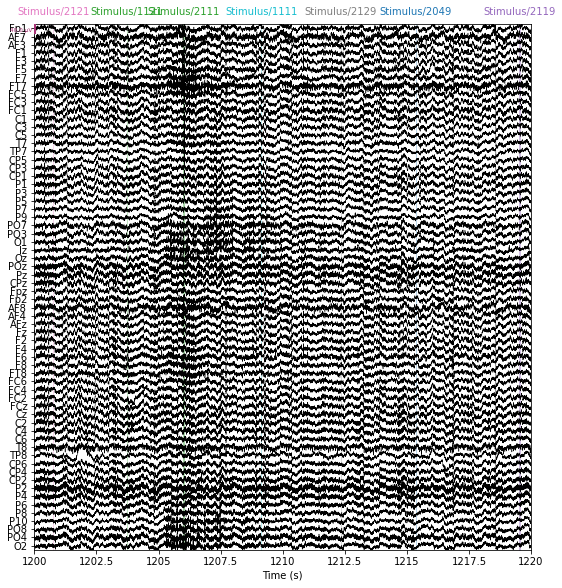

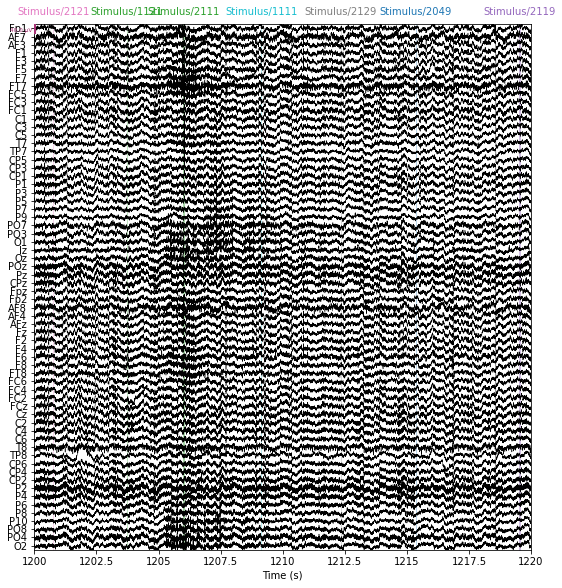

In [6]:
# QA: check time domain results...
start_time=1200 # 
duration_time=20 #start=start_time, 
raw_reref_filt.plot(n_channels=66, start=start_time, duration=duration_time, group_by='type', clipping=None, show_scrollbars=False)
raw_reref_filt_ecgRemoved.plot(n_channels=66, start=start_time, duration=duration_time, group_by='type',clipping=None, show_scrollbars=False)

<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG
 custom_ref_applied: True
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 1.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 512.0 Hz
>
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 64 PCA components


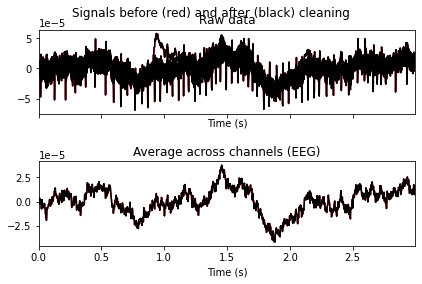

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
2245 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Not setting metadata
2245 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


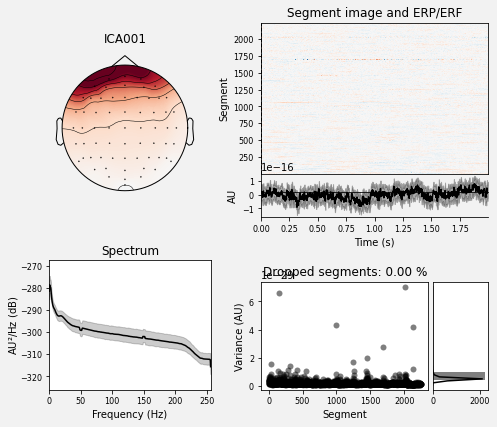

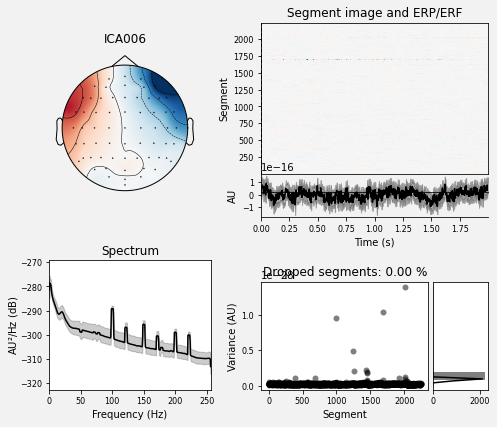

[<Figure size 504x432 with 6 Axes>, <Figure size 504x432 with 6 Axes>]

In [8]:
# QA: check ICA results...
print(raw_reref_filt_ecgRemoved.info)
# before and after ICA
ica.plot_overlay(raw_reref_filt_ecgRemoved)
# each ICA
ica.plot_properties(raw_reref_filt_ecgRemoved, picks=tmp_eog_ica)